In [134]:
import warnings
warnings.filterwarnings("ignore")

In [145]:
%pylab inline
import plotly.plotly as py
import plotly.graph_objs as go
import pickle
from scipy import stats
import seaborn as sns
sns.set_style('darkgrid')
import pickle
%config InlineBackend.figure_format = 'retina'
matplotlib.rcParams['figure.figsize'] = 19,14
import random
from itertools import chain
sns.set_context('poster',font_scale=1.4)
from CSAB import ModelErrors, getCounterAndDeltaXips

Populating the interactive namespace from numpy and matplotlib


In [177]:
sns.set_palette('colorblind')

In [141]:
SimsUsed = ['baseline2018a', 
            'pontus_2579',  # rolling cadence
            'colossus_2664', # galactic plane
            'kraken_2042',  # single 30s exposure
            'pontus_2489',  # 20s exposures
            'pontus_2002'  # wide area
           ] 

## Metric Plot

In [142]:
yearly = {}
counter = pickle.load(open('counter10_Y10.p','rb'))
for key in SimsUsed:
    val = []
    for year in ['1', '3', '6', '10']:
        counter = pickle.load(open('counter'+year+'_Y10.p','rb'))
        val.append(np.mean(list(counter[key][key].values())))
    yearly[key] = val

In [143]:
x = list(yearly.keys())
y1 = [i[0] for i in list(yearly.values())]
y2 = [i[1] for i in list(yearly.values())]
y3 = [i[2] for i in list(yearly.values())]
y4 = [i[3] for i in list(yearly.values())]

In [144]:

trace1 = go.Bar(
    x=x,
    y=y1,
    name='Year 1',
    marker=dict(
        color=["#08306b"]*len(x))
)
trace2 = go.Bar(
    x=x,
    y=y2,
    name='Year 3',
    marker=dict(
        color=["#4292c6"]*len(x)),
    opacity=0.4
)

trace3 = go.Bar(
    x=x,
    y=y3,
    name='Year 6',
    marker=dict(
        color=["#9ecae1"]*len(x)),
    opacity=0.3
)

trace4 = go.Bar(
    x=x,
    y=y4,
    name='Year 10',
    marker=dict(
        color=["#deebf7"]*len(x)),
    opacity=0.4
)

data = [trace1, trace2, trace3, trace4]
layout = go.Layout(
    barmode='overlay'
)

fig = go.Figure(data=data, layout=layout)
py.iplot(fig, filename='paper-metric')


## Dither pattern comparison -- translational

In [211]:
ls angles_*.npy

angles_hex_visit1.npy       angles_rot_random_visit1.npy
angles_hex_visit10.npy      angles_rot_random_visit10.npy
angles_random_visit1.npy    angles_rot_spiral_visit1.npy
angles_random_visit10.npy   angles_rot_spiral_visit10.npy
angles_rot_hex_visit1.npy   angles_spiral_visit1.npy
angles_rot_hex_visit10.npy  angles_spiral_visit10.npy


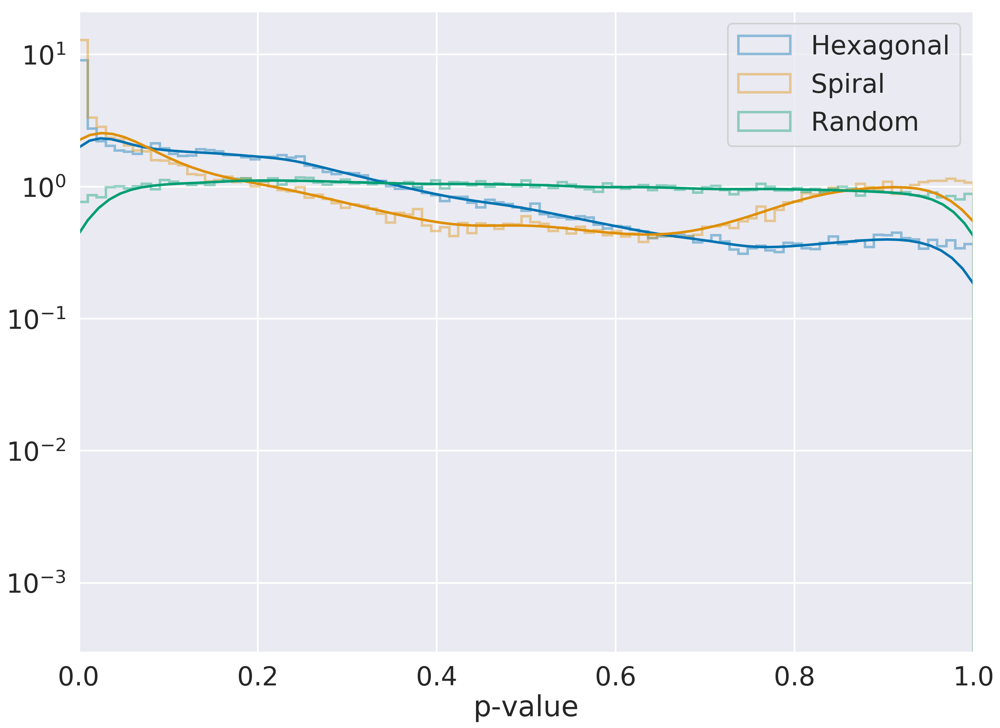

In [231]:
for filename, legend in zip(
                ['angles_hex_visit1.npy', 
                 'angles_spiral_visit1.npy',
                 'angles_random_visit1.npy'],
                ['Hexagonal', 'Spiral', 'Random']
                ):

    sts = []
    pvalues = []
    for angles in list((np.load(filename))[()].values()):
        angles = list(filter(lambda a: a != 0, angles))
        angles = list(filter(lambda a: a != -90, angles))
        angles = list(filter(lambda a: a != 90, angles))
        if len(angles)==0:
            pass
        else:
            pvalues.append(stats.kstest(angles,'uniform',args=(-90,180), N=500, alternative = 'greater').pvalue)
    sns.distplot(pvalues,
                 bins=np.linspace(0,1,100),
                 label=legend,
                 hist_kws = dict(linewidth=3,
                                 histtype='step'),
                 norm_hist=True);
plt.yscale('log')    
plt.legend()
plt.xlim((0, 1))
plt.xlabel('p-value');

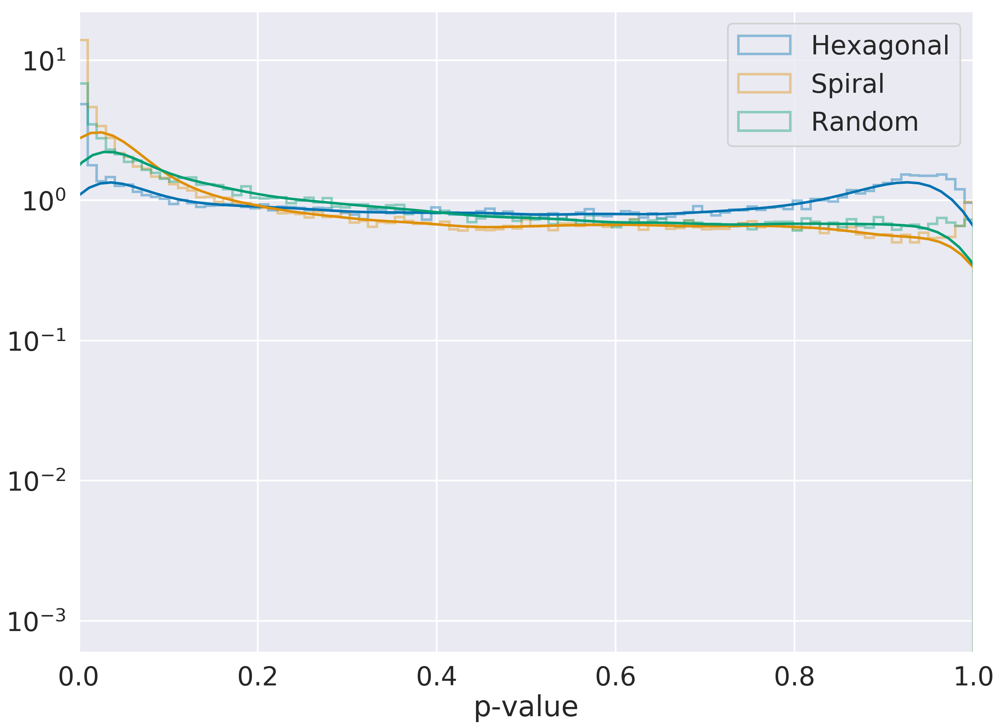

In [232]:
for filename, legend in zip(
                ['angles_hex_visit10.npy', 
                 'angles_spiral_visit10.npy',
                 'angles_random_visit10.npy'],
                ['Hexagonal', 'Spiral', 'Random']
                ):

    sts = []
    pvalues = []
    for angles in list((np.load(filename))[()].values()):
        angles = list(filter(lambda a: a != 0, angles))
        angles = list(filter(lambda a: a != -90, angles))
        angles = list(filter(lambda a: a != 90, angles))
        pvalues.append(stats.kstest(angles,'uniform',args=(-90,180), N=1000, alternative='greater').pvalue)
    sns.distplot(pvalues,
                 bins=np.linspace(0,1,100),
                 label=legend,
                 hist_kws=dict(linewidth=3,
                               histtype='step'),
                 norm_hist=True);
plt.yscale('log')    
plt.legend()
plt.xlim((0, 1))
plt.xlabel('p-value');

## rotational

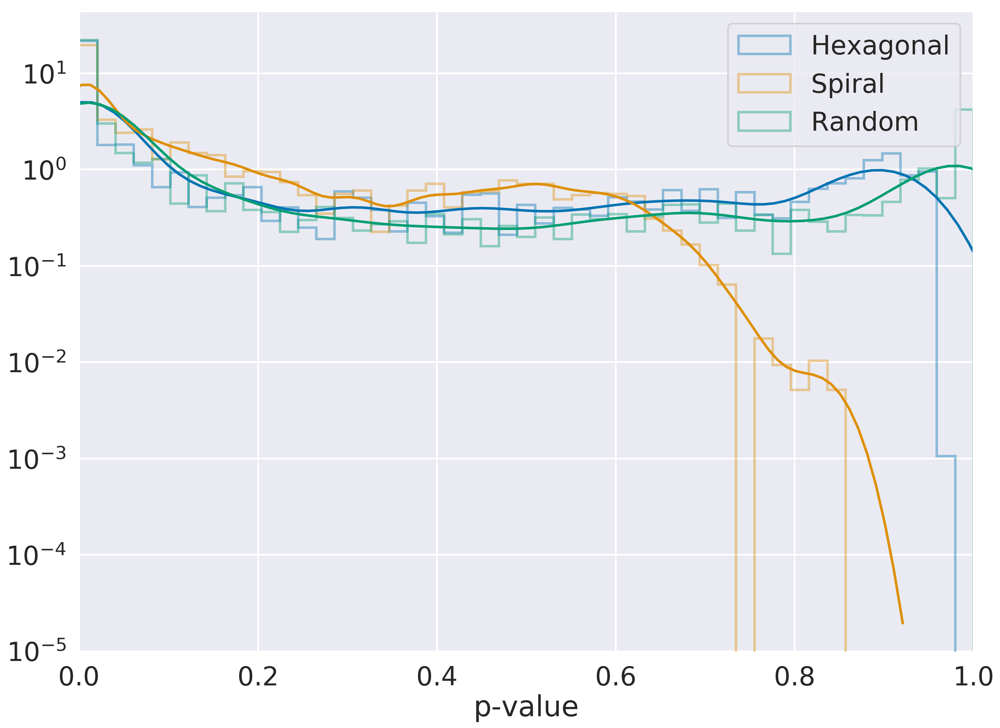

In [237]:
for filename, legend in zip(
                ['angles_rot_hex_visit1.npy', 
                 'angles_rot_spiral_visit1.npy',
                 'angles_rot_random_visit1.npy'],
                ['Hexagonal', 'Spiral', 'Random']
                ):

    sts = []
    pvalues = []
    for angles in list((np.load(filename))):
        if len(angles)==0:
            pass
        else:
            pvalues.append(stats.kstest(angles,'uniform',args=(-90,180),
                                    N=1000, alternative='greater').pvalue)
    sns.distplot(pvalues,
                 bins=np.linspace(0,1,50),
                 label=legend,
                 hist_kws=dict(linewidth=3,
                               histtype='step'),
                 norm_hist=True);
plt.yscale('log')    
plt.legend()
plt.xlim((0, 1))
plt.xlabel('p-value');

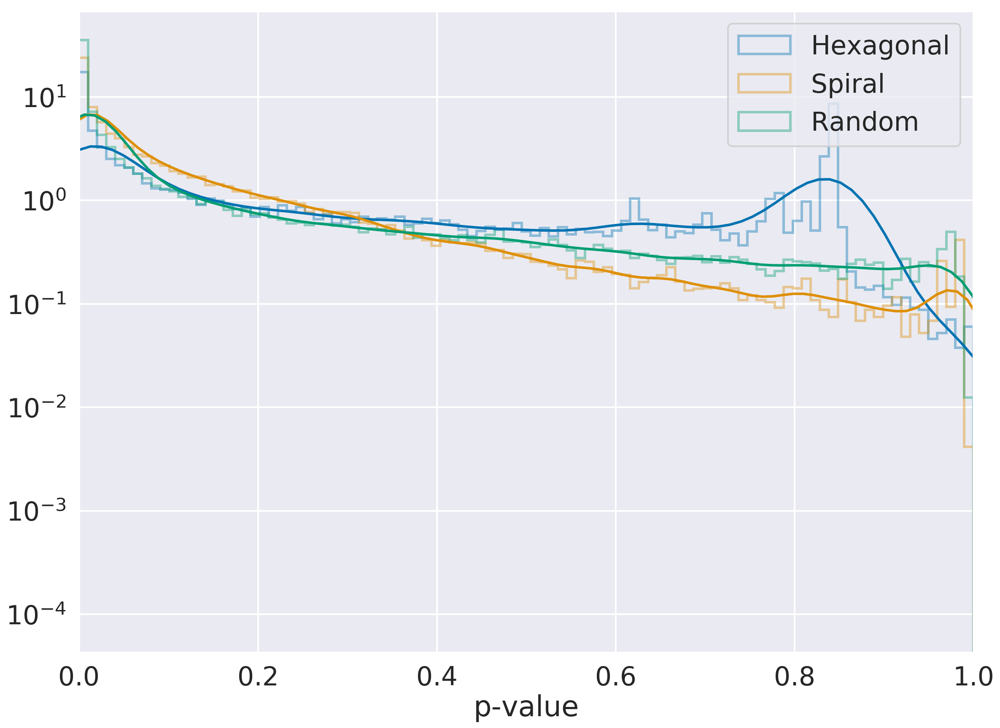

In [234]:
for filename, legend in zip(
                ['angles_rot_hex_visit10.npy', 
                 'angles_rot_spiral_visit10.npy',
                 'angles_rot_random_visit10.npy'],
                ['Hexagonal', 'Spiral', 'Random']
                ):

    sts = []
    pvalues = []
    for angles in list((np.load(filename))):
        pvalues.append(stats.kstest(angles,'uniform',args=(-90,180),
                                    N=1000, alternative='greater').pvalue)
    sns.distplot(pvalues,
                 bins=np.linspace(0,1,100),
                 label=legend,
                 hist_kws=dict(linewidth=3,
                               histtype='step'),
                 norm_hist=True);
plt.yscale('log')    
plt.legend()
plt.xlim((0, 1))
plt.xlabel('p-value');

In [238]:
ls newcutnpys/baseline*

newcutnpys/baseline2018a1.npy
newcutnpys/baseline2018a10.npy
newcutnpys/baseline2018a3.npy
newcutnpys/baseline2018a6.npy
newcutnpys/baseline2018afield1.npy
newcutnpys/baseline2018ahex_visit1.npy
newcutnpys/baseline2018ahex_visit10.npy
newcutnpys/baseline2018ahex_visitTrue1.npy
newcutnpys/baseline2018ahex_visitTrue10.npy
newcutnpys/baseline2018arandom_visit1.npy
newcutnpys/baseline2018arandom_visit10.npy
newcutnpys/baseline2018arandom_visit3.npy
newcutnpys/baseline2018arandom_visit6.npy
newcutnpys/baseline2018arandom_visitTrue1.npy
newcutnpys/baseline2018arandom_visitTrue10.npy
newcutnpys/baseline2018aspiral_visit1.npy
newcutnpys/baseline2018aspiral_visit10.npy
newcutnpys/baseline2018aspiral_visitTrue1.npy
newcutnpys/baseline2018aspiral_visitTrue10.npy


## translational

In [243]:
ex = np.load(st+'random_visit1.npy')

In [245]:
import pandas as pd

In [273]:
df = pd.DataFrame()
exp = 0
for delta_xip in ex:
    exp += 1
    newdf = pd.DataFrame(
    dict(delta_xip = delta_xip,
         r = r,
         exp = exp)
    )
    df = pd.concat((df, newdf))

(0.01, 2)

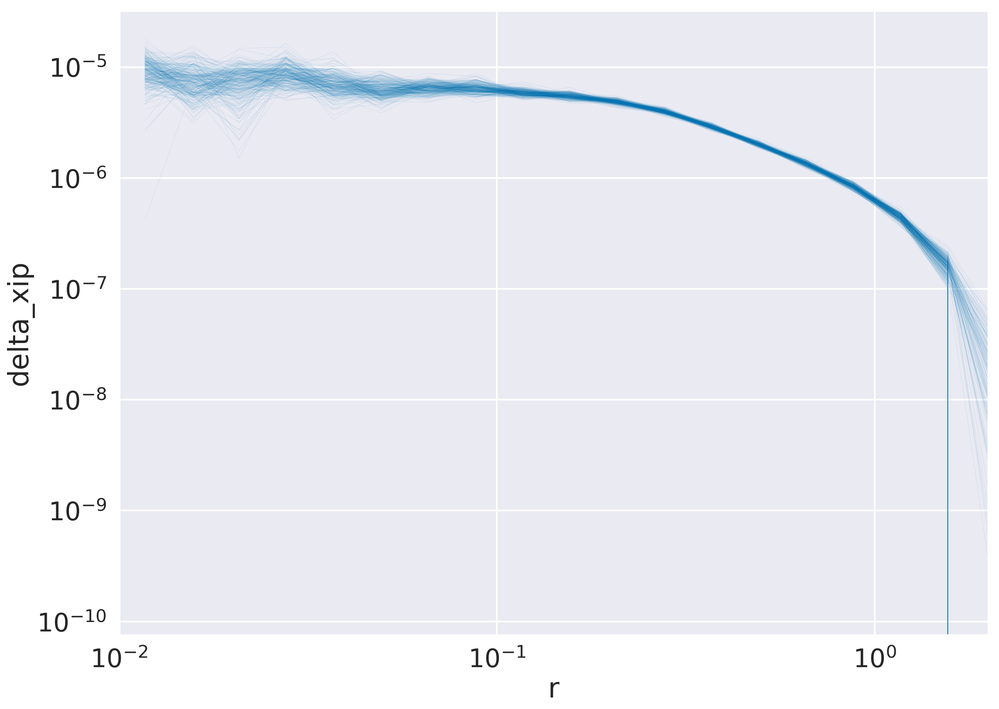

In [288]:
sns.lineplot(x='r',
             y='delta_xip',
             units='exp',
             dashes=True,
             data=df,
             estimator=None,
             err_style='band',
             lw=0.5,
             alpha=0.1);
plt.yscale('log')
plt.xscale('log')
plt.xlim((0.01, 2))

(3e-07, 5e-05)

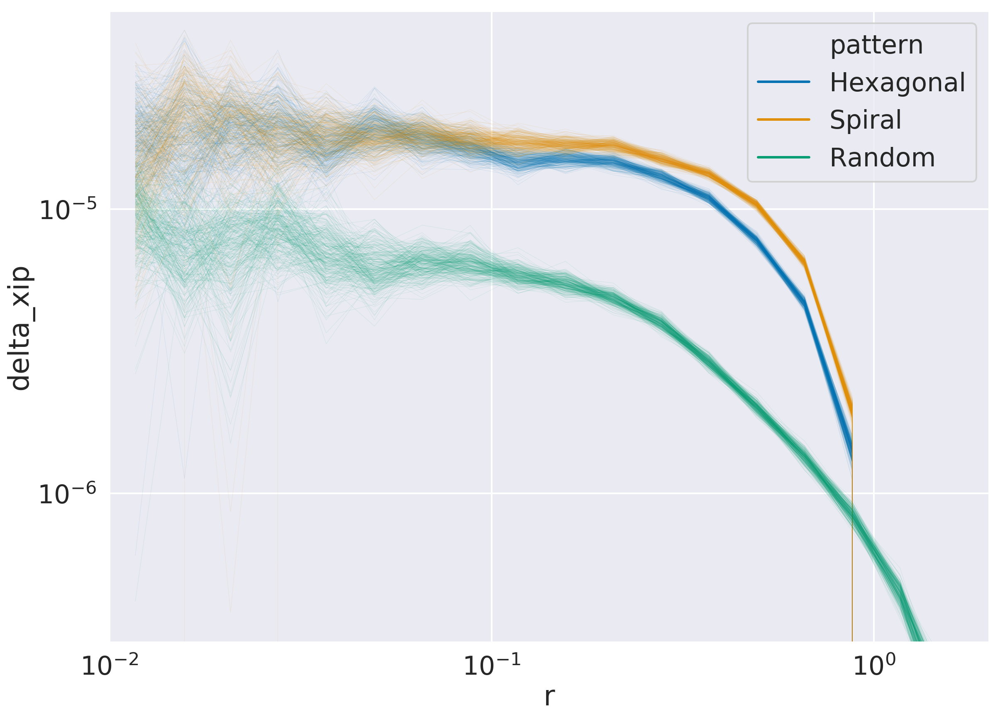

In [299]:
r = np.load('npys/r.npy')
st = 'newcutnpys/baseline2018a'
df = pd.DataFrame()
for filename, leg in zip([st+'hex_visit1.npy',
                          st+'spiral_visit1.npy',
                          st+'random_visit1.npy'],
                         ['Hexagonal', 'Spiral', 'Random']):
    
    ex = np.load(filename)
    exp = 0
    for delta_xip in ex:
        exp += 1
        newdf = pd.DataFrame(
        dict(delta_xip = delta_xip,
             r = r,
             exp = exp,
             pattern=leg)
        )
        df = pd.concat((df, newdf))

sns.lineplot(x='r',
             y='delta_xip',
             units='exp',
             hue='pattern',
             dashes=True,
             data=df,
             estimator=None,
             err_style='band',
             lw=0.5,
             alpha=0.1);
plt.yscale('log')
plt.xscale('log')
plt.legend()
plt.xlim((0.01, 2))
plt.ylim((3e-7, 5e-5))

(4e-07, 3e-06)

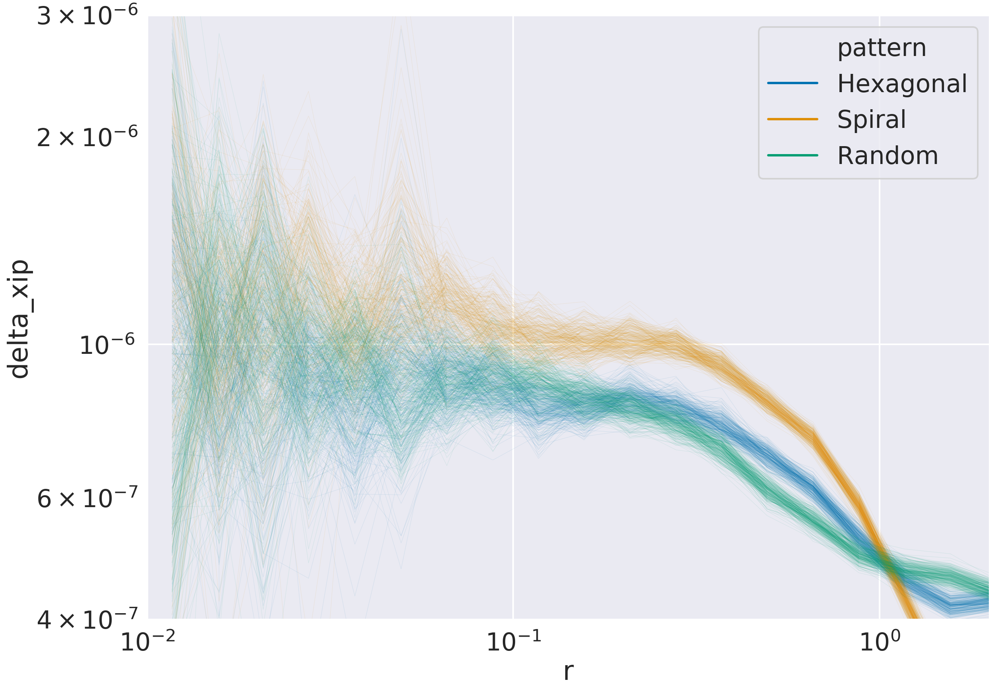

In [305]:
r = np.load('npys/r.npy')
st = 'newcutnpys/baseline2018a'
df = pd.DataFrame()
for filename, leg in zip([st+'hex_visit10.npy',
                          st+'spiral_visit10.npy',
                          st+'random_visit10.npy'],
                         ['Hexagonal', 'Spiral', 'Random']):
    
    ex = np.load(filename)
    exp = 0
    for delta_xip in ex:
        exp += 1
        newdf = pd.DataFrame(
        dict(delta_xip = delta_xip,
             r = r,
             exp = exp,
             pattern=leg)
        )
        df = pd.concat((df, newdf))

sns.lineplot(x='r',
             y='delta_xip',
             units='exp',
             hue='pattern',
             dashes=True,
             data=df,
             ci=68,
             estimator=None,
             err_style='band',
             lw=0.5,
             alpha=0.1);
plt.yscale('log')
plt.xscale('log')
plt.legend()
plt.xlim((0.01, 2))
plt.ylim((4e-7, 3e-6))

In [306]:
ls newcutnpys/baseline2018a*

newcutnpys/baseline2018a1.npy
newcutnpys/baseline2018a10.npy
newcutnpys/baseline2018a3.npy
newcutnpys/baseline2018a6.npy
newcutnpys/baseline2018afield1.npy
newcutnpys/baseline2018ahex_visit1.npy
newcutnpys/baseline2018ahex_visit10.npy
newcutnpys/baseline2018ahex_visitTrue1.npy
newcutnpys/baseline2018ahex_visitTrue10.npy
newcutnpys/baseline2018arandom_visit1.npy
newcutnpys/baseline2018arandom_visit10.npy
newcutnpys/baseline2018arandom_visit3.npy
newcutnpys/baseline2018arandom_visit6.npy
newcutnpys/baseline2018arandom_visitTrue1.npy
newcutnpys/baseline2018arandom_visitTrue10.npy
newcutnpys/baseline2018aspiral_visit1.npy
newcutnpys/baseline2018aspiral_visit10.npy
newcutnpys/baseline2018aspiral_visitTrue1.npy
newcutnpys/baseline2018aspiral_visitTrue10.npy


(8e-05, 0.0004)

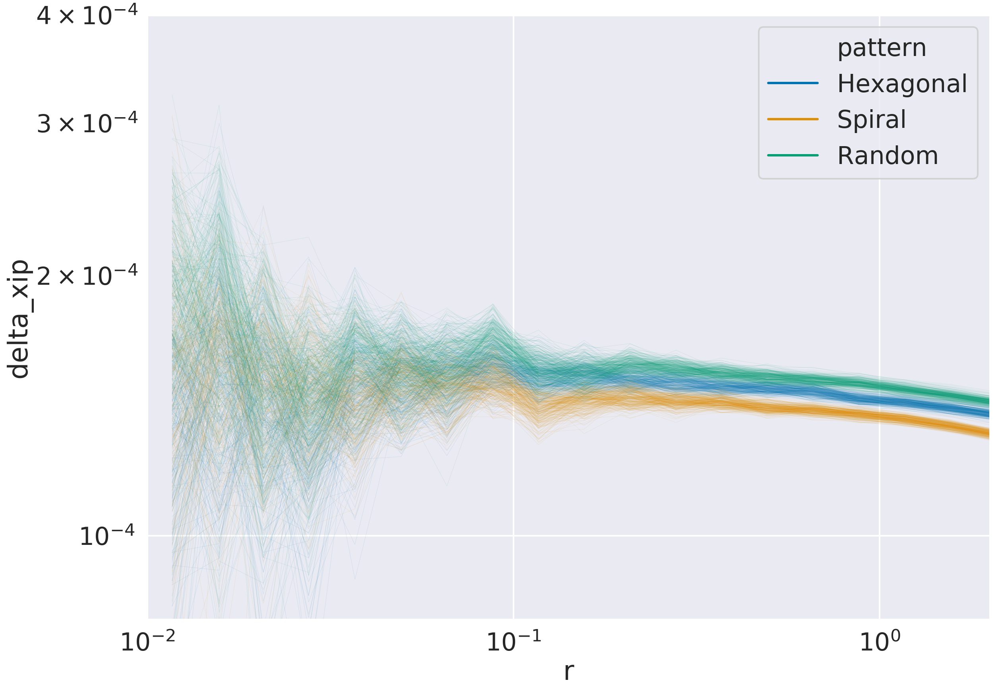

In [310]:
r = np.load('npys/r.npy')
st = 'newcutnpys/baseline2018a'
df = pd.DataFrame()
for filename, leg in zip([st+'hex_visitTrue1.npy',
                          st+'spiral_visitTrue1.npy',
                          st+'random_visitTrue1.npy'],
                         ['Hexagonal', 'Spiral', 'Random']):
    
    ex = np.load(filename)
    exp = 0
    for delta_xip in ex:
        exp += 1
        newdf = pd.DataFrame(
        dict(delta_xip = delta_xip,
             r = r,
             exp = exp,
             pattern=leg)
        )
        df = pd.concat((df, newdf))

sns.lineplot(x='r',
             y='delta_xip',
             units='exp',
             hue='pattern',
             dashes=True,
             data=df,
             ci=68,
             estimator=None,
             err_style='band',
             lw=0.5,
             alpha=0.1);
plt.yscale('log')
plt.xscale('log')
plt.legend()
plt.xlim((0.01, 2))
plt.ylim((8e-5, 4e-4))

(0.01, 2)

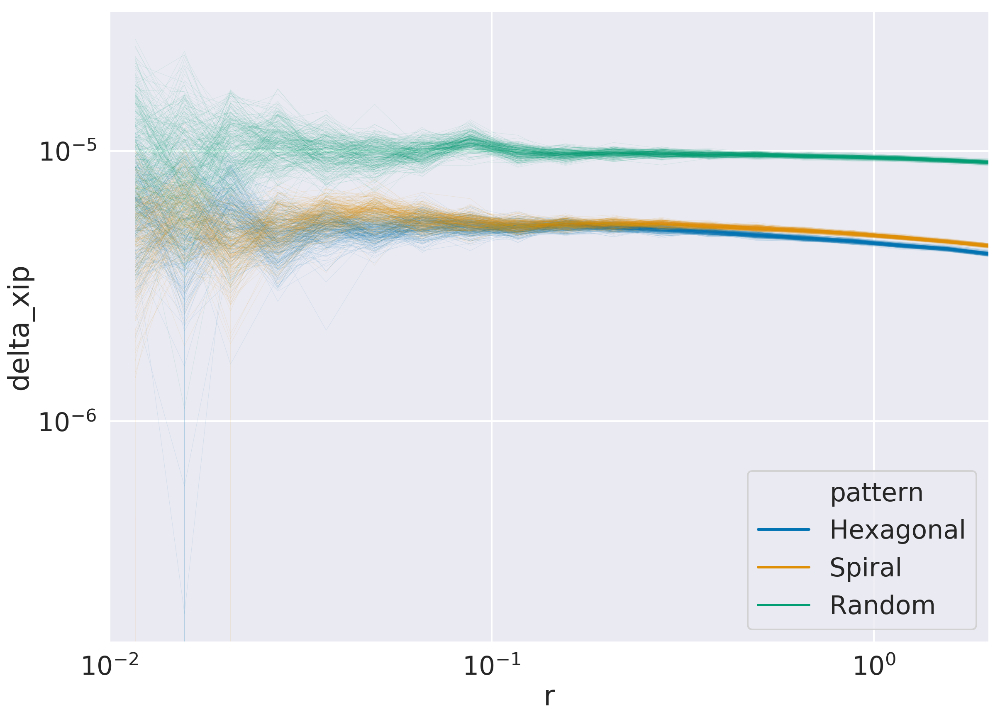

In [311]:
r = np.load('npys/r.npy')
st = 'newcutnpys/baseline2018a'
df = pd.DataFrame()
for filename, leg in zip([st+'hex_visitTrue10.npy',
                          st+'spiral_visitTrue10.npy',
                          st+'random_visitTrue10.npy'],
                         ['Hexagonal', 'Spiral', 'Random']):
    
    ex = np.load(filename)
    exp = 0
    for delta_xip in ex:
        exp += 1
        newdf = pd.DataFrame(
        dict(delta_xip = delta_xip,
             r = r,
             exp = exp,
             pattern=leg)
        )
        df = pd.concat((df, newdf))

sns.lineplot(x='r',
             y='delta_xip',
             units='exp',
             hue='pattern',
             dashes=True,
             data=df,
             ci=68,
             estimator=None,
             err_style='band',
             lw=0.5,
             alpha=0.1);
plt.yscale('log')
plt.xscale('log')
plt.legend()
plt.xlim((0.01, 2))
#plt.ylim((4e-7, 3e-6))

In [313]:
SimsUsed

['baseline2018a',
 'pontus_2579',
 'colossus_2664',
 'kraken_2042',
 'pontus_2489',
 'pontus_2002']

In [346]:
sns.set_palette('Set2', n_colors=len(SimsUsed))

(1e-06, 2e-05)

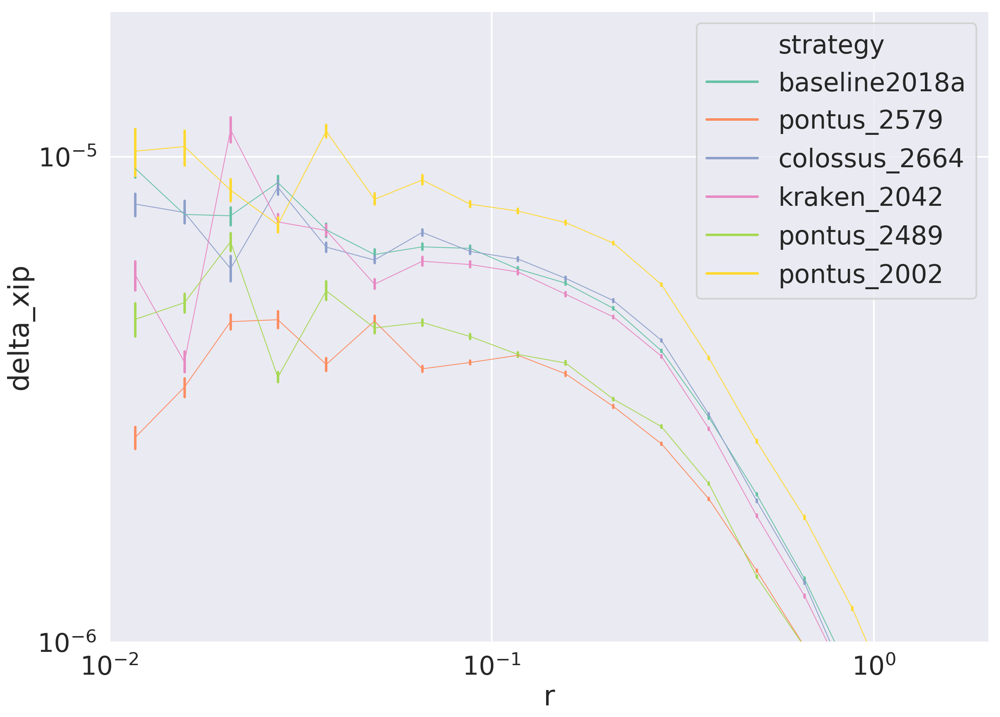

In [347]:
r = np.load('npys/r.npy')
st = 'newcutnpys/'
df = pd.DataFrame()
for filename, leg in zip([st+name+'random_visit1.npy' for name in SimsUsed],
                         SimsUsed):
    
    ex = np.load(filename)
    exp = 0
    for delta_xip in ex:
        exp += 1
        newdf = pd.DataFrame(
        dict(delta_xip = delta_xip,
             r = r,
             exp = exp,
             strategy=leg)
        )
        df = pd.concat(
            (df, newdf)
        )

sns.lineplot(x='r',
             y='delta_xip',
             hue='strategy',
             dashes=True,
             data=df,
             ci=99,
             err_style='bars',
             lw=1,
             alpha=1);
plt.yscale('log')
plt.xscale('log')
plt.legend()
plt.xlim((0.01, 2))
plt.ylim((1e-6, 2e-5))

(0.01, 2)

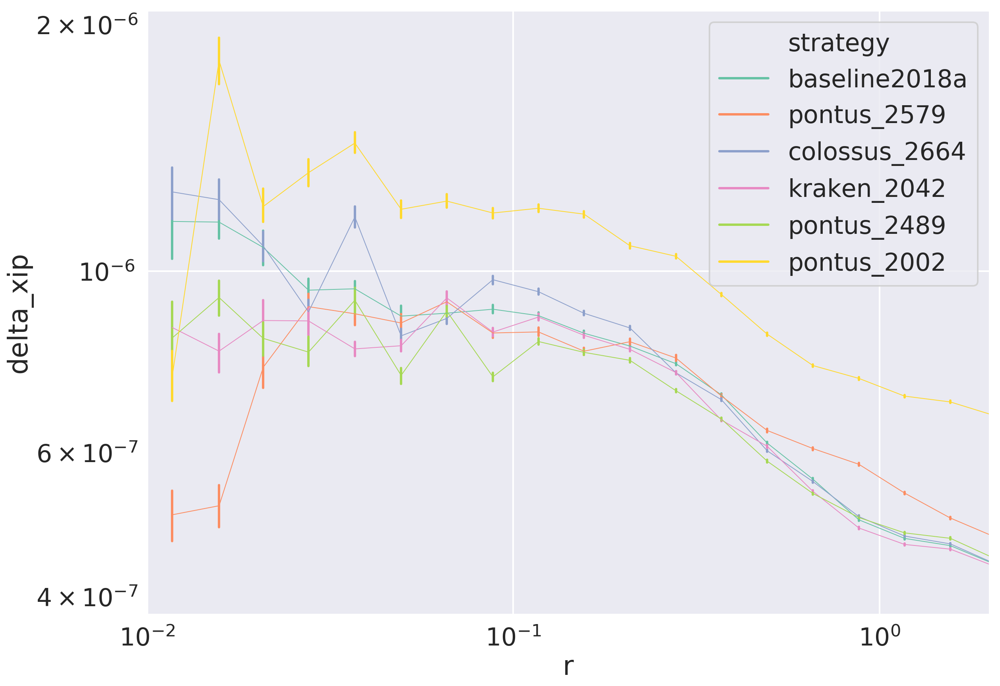

In [349]:
r = np.load('npys/r.npy')
st = 'newcutnpys/'
df = pd.DataFrame()
for filename, leg in zip([st+name+'random_visit10.npy' for name in SimsUsed],
                         SimsUsed):
    
    ex = np.load(filename)
    exp = 0
    for delta_xip in ex:
        exp += 1
        newdf = pd.DataFrame(
        dict(delta_xip = delta_xip,
             r = r,
             exp = exp,
             strategy=leg)
        )
        df = pd.concat(
            (df, newdf)
        )

sns.lineplot(x='r',
             y='delta_xip',
             hue='strategy',
             dashes=True,
             data=df,
             ci=99,
             err_style='bars',
             lw=1,
             alpha=1);
plt.yscale('log')
plt.xscale('log')
plt.legend()
plt.xlim((0.01, 2))
#plt.ylim((1e-6, 2e-5))